In [1]:
%run setting.ipynb

In [2]:
import os
import re
import pandas as pd
from pandasql import sqldf
import yfinance as yf

pysqldf = lambda q: sqldf(q, globals())

In [3]:
import numpy as np
from sklearn.linear_model import LinearRegression
import plotly.express as px

# configuration

In [4]:
leverage_ratio = 3

ETF = '^GSPC'
ETF_3x = 'SPXL'

# data loading

## GSPC

In [5]:
qqq = yf.Ticker(ETF).history(
    period='max', 
    interval='1d', 
    actions=False)

qqq =  pd.read_csv(f'^NDX.csv', )

In [6]:
qqq = qqq.reset_index()
qqq['id'] = qqq.index
qqq['Date'] = pd.to_datetime(qqq['Date']).dt.date

In [7]:
qqq.head(2)

,Date,Open,High,Low,Close,Volume,id
0,1927-12-30,17.66,17.66,17.66,17.66,0,0
1,1928-01-03,17.76,17.76,17.76,17.76,0,1


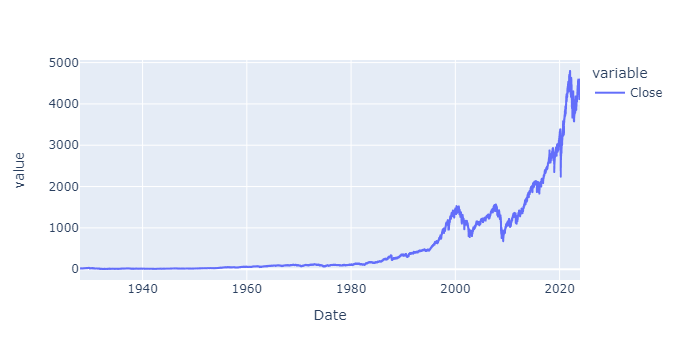

In [8]:
fig = px.line(qqq, x='Date', y=["Close"])
fig.show()

In [9]:
len(qqq)

24096

## SSO

data_3x = yf.Ticker(ETF_3x).history(
    period='max', 
    interval='1d', 
    actions=False)

In [10]:
data_3x =  pd.read_csv(f'{ETF_3x}.csv', )

In [11]:
data_3x = data_3x.reset_index()
data_3x['id'] = data_3x.index
data_3x['Date'] = pd.to_datetime(data_3x['Date']).dt.date

data_3x.head(2)

,index,Date,Open,High,Low,Close,Adj Close,Volume,id
0,0,2008-11-05,4.811667,4.899167,4.176667,4.25,3.354058,229200,0
1,1,2008-11-06,4.150000,4.197500,3.552500,3.60,2.841084,4332000,1


# daily percentage

In [12]:
qqq = pysqldf(u"""
    select qqq.*, 
    pre_day.Date as pre_Date,
    pre_day.Close as pre_Close,
    (qqq.Close - pre_day.Close)/pre_day.Close AS Percent    
    from qqq 
    left join qqq as pre_day on pre_day.id+1 = qqq.id
    order by qqq.Date asc
    """)

In [13]:
pysqldf(u"""
    select * 
    from qqq
    order by Date asc
    limit 2
    """)

,Date,Open,High,Low,Close,Volume,id,pre_Date,pre_Close,Percent
0,1927-12-30,17.66,17.66,17.66,17.66,0,0,None,NaN,NaN
1,1928-01-03,17.76,17.76,17.76,17.76,0,1,1927-12-30,17.66,0.005663


# simulation

In [14]:
data_list = pysqldf(u"""
    select 
    Date,
    Percent, 
    {}*Percent as Leveraged_Percent
    from qqq
    where Percent is not null
    """.format(leverage_ratio)).to_dict('records')

In [15]:
data_list[0:3]

[{'Date': '1928-01-03',
  'Percent': 0.0056625358059887295,
  'Leveraged_Percent': 0.016987607417966188},
 {'Date': '1928-01-04',
  'Percent': -0.002252303773188757,
  'Leveraged_Percent': -0.006756911319566272},
 {'Date': '1928-01-05',
  'Percent': -0.009593684135519493,
  'Leveraged_Percent': -0.02878105240655848}]

In [16]:
start_price = qqq['Close'][0]

qqq_price = start_price
tqqq_price = start_price

for r in data_list:
    ###
    qqq_price = qqq_price*(1+r['Percent'])
    r['price'] = qqq_price
    ###
    tqqq_price = tqqq_price*(1+r['Leveraged_Percent'])    
    r['Leveraged_price'] = tqqq_price  

data1 = pd.DataFrame(data_list)

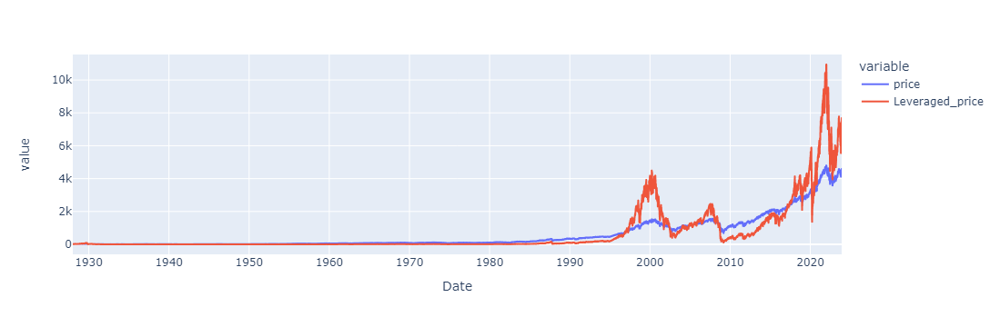

In [17]:
fig = px.line(data1, x='Date', y=[
    'price', 
    'Leveraged_price',
    ])
fig.show()

# regression

In [18]:
compare_3x = pysqldf(u"""
    select 
    data1.Date,
    data1.`Leveraged_price`,
    data_3x.Close
    from data_3x
    join data1 on data1.Date = data_3x.Date
    order by data1.Date asc
    """.format(leverage_ratio))

In [19]:
X = compare_3x['Leveraged_price'].to_numpy()
X = np.array([[i] for i in X])
y = compare_3x['Close'].to_numpy()

In [20]:
reg = LinearRegression().fit(X, y)

In [21]:
reg.score(X, y)

print(reg.coef_)

print(reg.intercept_)

[0.01326096]
-0.7800964039077343


In [22]:
result = pysqldf(u"""
    select 
    Date,
    `Leveraged_price` * {} + {} AS simulated_Close,
    Close
    from compare_3x
    """.format(
    reg.coef_[0],
    reg.intercept_))

result.plot(x ='Date', y=[
    'simulated_Close', 
    'Close',
    ], grid = True)

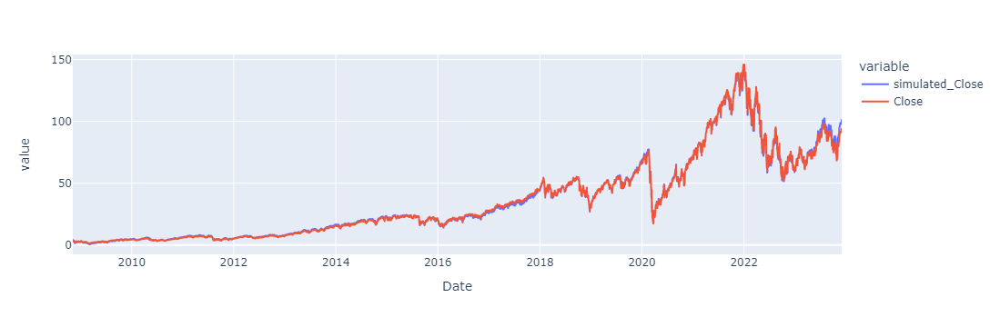

In [23]:
fig = px.line(result, x='Date', y=["simulated_Close",'Close'])
fig.show()

all simulation results

In [24]:
final_result = pysqldf(f"""
    select 
    data1.Date,
    data1.price AS `{ETF}`,
    data1.`Leveraged_price` * {reg.coef_[0]} + {reg.intercept_} AS simulated_{ETF_3x},
    data_3x.Close as {ETF_3x}
    from data1
    left join data_3x on data_3x.Date = data1.Date
    """)

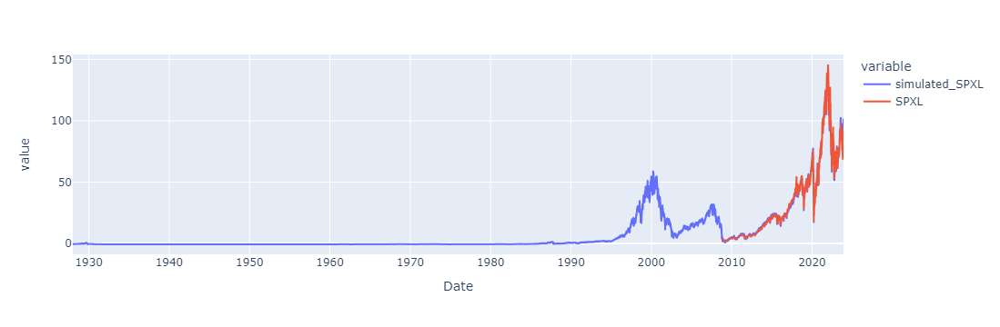

In [25]:
fig = px.line(
    final_result, x='Date', y=[
    'simulated_{}'.format(ETF_3x),
    ETF_3x])
fig.show()

final_result.plot(x ='Date', y=[
    'simulated_{}'.format(ETF_3x),
    ETF_3x,
    ], grid = True)

In [26]:
final_result.to_excel(
    '{}_simulation.xlsx'.format(ETF_3x),
    index = False,
    )

# END